In [3]:
# import kagglehub

# # Download latest version
# path = kagglehub.dataset_download("daehoyang/flickr2k")

# print("Path to dataset files:", path)

In [1]:
import os
import glob
import random
from PIL import Image, ImageEnhance, ImageOps, ImageFilter
from tqdm import tqdm

In [2]:
all_images = sorted(glob.glob(os.path.join('/kaggle/input/flickr2k/Flickr2K', "*.png")))
len(all_images)

2650

In [3]:
downscale_factor = 4
blur_radius = 1.5
random.seed(42)

In [4]:
def downsample_image(hr_image, scale_factor=4):
    hr_width, hr_height = hr_image.size
    lr_width, lr_height = hr_width // scale_factor, hr_height // scale_factor
    lr_image = hr_image.resize((lr_width, lr_height), Image.BICUBIC)
    return lr_image

In [5]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from tqdm.notebook import tqdm
import sys

In [6]:
import os
import torch
from torch.utils.data import Dataset
from torchvision import transforms
from PIL import Image
import random

def downsample_image(hr_image, scale_factor=4):
    """
    Downsamples the high-resolution image to create a low-resolution image.
    """
    hr_width, hr_height = hr_image.size
    lr_width, lr_height = hr_width // scale_factor, hr_height // scale_factor
    lr_image = hr_image.resize((lr_width, lr_height), Image.BICUBIC)
    return lr_image

class SuperResolutionDataset(Dataset):
    def __init__(self, hr_folder, hr_transform=None, lr_transform=None, scale_factor=4):
        """
        Args:
            hr_folder (str): Path to the folder containing high-resolution images
            hr_transform (callable, optional): Transform to apply to the high-resolution image
            lr_transform (callable, optional): Transform to apply to the low-resolution image
            scale_factor (int): Scale factor for creating low-resolution images
        """
        self.hr_folder = hr_folder
        self.hr_images = sorted(os.listdir(hr_folder))
        self.hr_transform = hr_transform
        self.lr_transform = lr_transform
        self.scale_factor = scale_factor

    def __len__(self):
        return len(self.hr_images)

    def __getitem__(self, idx):
        hr_image_path = os.path.join(self.hr_folder, self.hr_images[idx])

        # Load high-resolution image
        hr_image = Image.open(hr_image_path)
        hr_image = hr_image.resize((640, 640), Image.BICUBIC)

        # Create low-resolution image from high-resolution
        lr_image = downsample_image(hr_image, self.scale_factor)

        # Apply transformations if provided
        if self.hr_transform:
            hr_image = self.hr_transform(hr_image)
        if self.lr_transform:
            lr_image = self.lr_transform(lr_image)

        return lr_image, hr_image

In [7]:
from torch.utils.data import DataLoader
from torchvision import transforms

# Define the folder paths
hr_folder = '/kaggle/input/flickr2k/Flickr2K'

# Define transformations for HR and LR images
hr_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

lr_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Create the dataset
dataset = SuperResolutionDataset(hr_folder, hr_transform=hr_transform, lr_transform=lr_transform, scale_factor=4)

print(f"Length of dataset: {len(dataset)}")

Length of dataset: 2650


In [8]:
from torch.utils.data import DataLoader, random_split, TensorDataset

train_size = int(0.7 * len(dataset))
val_size = int(0.15 * len(dataset))
test_size = len(dataset) - train_size - val_size

train_dataset, val_dataset, test_dataset = random_split(dataset, [train_size, val_size, test_size])

train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=4, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=4, shuffle=False)

In [9]:
for i, j in train_loader:
  print(i.shape)
  print(j.shape)
  break

torch.Size([4, 3, 160, 160])
torch.Size([4, 3, 640, 640])


In [10]:
class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super(ResidualBlock, self).__init__()
        self.conv1 = nn.Conv2d(channels, channels, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(channels)
        self.prelu = nn.PReLU()
        self.conv2 = nn.Conv2d(channels, channels, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(channels)

    def forward(self, x):
        residual = self.conv1(x)
        residual = self.bn1(residual)
        residual = self.prelu(residual)
        residual = self.conv2(residual)
        residual = self.bn2(residual)

        return x + residual


class UpsampleBlock(nn.Module):
    def __init__(self, in_channels, up_scale):
        super(UpsampleBlock, self).__init__()
        self.conv = nn.Conv2d(
            in_channels, in_channels * up_scale ** 2, kernel_size=3, padding=1
            )
        self.pixel_shuffle = nn.PixelShuffle(up_scale)
        self.prelu = nn.PReLU()

    def forward(self, x):
        x = self.conv(x)
        x = self.pixel_shuffle(x)
        x = self.prelu(x)

        return x

In [11]:
class Generator(nn.Module):
    def __init__(self, scale_factor):
        super(Generator, self).__init__()
        upsample_block_num = int(math.log(scale_factor, 2))

        self.block1 = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=9, padding=4),
            nn.PReLU()
        )

        self.block2 = ResidualBlock(64)
        self.block3 = ResidualBlock(64)
        self.block4 = ResidualBlock(64)
        self.block5 = ResidualBlock(64)
        self.block6 = ResidualBlock(64)
        self.block7 = nn.Sequential(
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64)
        )
        block8 = [UpsampleBlock(64, 2) for _ in range(upsample_block_num)]
        block8.append(nn.Conv2d(64, 3, kernel_size=9, padding=4))
        self.block8 = nn.Sequential(*block8)

    def forward(self, x):
        block1 = self.block1(x)
        block2 = self.block2(block1)
        block3 = self.block3(block2)
        block4 = self.block4(block3)
        block5 = self.block5(block4)
        block6 = self.block6(block5)
        block7 = self.block7(block6)
        block8 = self.block8(block1 + block7)
        return (torch.tanh(block8) + 1) / 2


In [12]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.net = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            nn.LeakyReLU(0.2),

            nn.Conv2d(64, 64, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),

            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),

            nn.Conv2d(256, 256, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),

            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2),

            nn.Conv2d(512, 512, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2),

            nn.AdaptiveAvgPool2d(1),
            nn.Conv2d(512, 1024, kernel_size=1),
            nn.LeakyReLU(0.2),
            nn.Conv2d(1024, 1, kernel_size=1)
        )

    def forward(self, x):
        batch_size=x.size()[0]

        return torch.sigmoid(self.net(x).view(batch_size))

In [13]:
class TVLoss(nn.Module):
    def __init__(self, tv_loss_weight=1):
        super(TVLoss, self).__init__()
        self.tv_loss_weight=tv_loss_weight

    def forward(self, x):
        batch_size=x.size()[0]
        h_x = x.size()[2]
        w_x = x.size()[3]

        count_h = self.tensor_size(x[:, :, 1:, :])
        count_w = self.tensor_size(x[:, :, :, 1:])

        h_tv = torch.pow(x[:, :, 1:, :] - x[:, :, :h_x - 1, :], 2).sum()
        w_tv = torch.pow(x[:, :, :, 1:] - x[:, :, :, :w_x - 1], 2).sum()
        return self.tv_loss_weight * 2 * (h_tv / count_h + w_tv / count_w) / batch_size

    @staticmethod
    def tensor_size(t):
        return t.size()[1] * t.size()[2] * t.size()[3]


class GeneratorLoss(nn.Module):
    def __init__(self):
        super(GeneratorLoss, self).__init__()
        vgg = vgg16(weights='IMAGENET1K_V1')
        loss_network = nn.Sequential(*list(vgg.features)[:31]).eval()
        for param in loss_network.parameters():
            param.requires_grad = False
        self.loss_network = loss_network
        self.mse_loss = nn.MSELoss()
        self.tv_loss = TVLoss()

    def forward(self, out_labels, out_images, target_images):
        adversial_loss = torch.mean(1 - out_labels)
        perception_loss = self.mse_loss(out_images, target_images)
        image_loss = self.mse_loss(out_images, target_images)
        tv_loss = self.tv_loss(out_images)
        return image_loss + 0.001 * adversial_loss + 0.006 * perception_loss + 2e-8 * tv_loss

In [14]:
device  = torch.device("cuda" if torch.cuda.is_available() else "cpu")
import math
from torchvision.models.vgg import vgg16

netG = Generator(4)
netD = Discriminator()
generator_criterion = GeneratorLoss()

generator_criterion = generator_criterion.to(device)
netG = netG.to(device)
netD = netD.to(device)

optimizerG = optim.Adam(netG.parameters(), lr=0.0002)
optimizerD = optim.Adam(netD.parameters(), lr=0.0002)

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:02<00:00, 196MB/s]  


In [15]:
def trainer(netG, netD, trainloader, valloader, N_EPOCHS=150, N_ROUNDS=4):
    BEST_METRIC = -np.inf
    BEST_LOSS = np.inf
    K = 0
    results = {
        "d_train_loss":[], "d_valid_loss":[], "g_train_loss":[], "g_valid_loss":[],
        "d_train_score": [], "d_valid_score":[], "g_train_score": [], "g_valid_score":[],
        "train_psnr": [], "valid_psnr":[], "train_ssim": [], "valid_ssim":[]
    }

    for epoch in range(1, N_EPOCHS + 1):
        is_early_stopping = False
        train_bar = tqdm(trainloader)
        running_results = {
            'd_loss': 0, "g_loss": 0, 'd_score': 0, 
            'g_score': 0, 'psnr': 0, 'ssim': 0
        }

        metrics = [PeakSignalNoiseRatio(), StructuralSimilarityIndexMeasure()]

        netG.train()
        netD.train()
        for data, target in train_bar:

            real_img = Variable(target).to(device)
            z = Variable(data).to(device)

            fake_img = netG(z)
            netD.zero_grad()
            real_out = netD(real_img).mean()
            fake_out = netD(fake_img).mean()
            d_loss = 1 - real_out + fake_out
            d_loss.backward(retain_graph=True)
            optimizerD.step()

            fake_img = netG(z)
            fake_out = netD(fake_img).mean()
            netG.zero_grad()
            g_loss = generator_criterion(fake_out, fake_img, real_img)
            g_loss.backward()

            optimizerG.step()

            running_results['g_loss'] += g_loss.item()
            running_results['d_loss'] += d_loss.item()
            running_results['d_score'] += real_out.item()
            running_results['g_score'] += fake_out.item()

            psnr = metrics[0](real_img.detach().cpu() * 255, fake_img.detach().cpu() * 255).item()
            ssim = metrics[1](real_img.detach().cpu() * 255, fake_img.detach().cpu() * 255).item()
            running_results['psnr'] += psnr
            running_results['ssim'] += ssim

            train_bar.set_description(desc="T [%d/%d] Loss_D: %.4f | Loss_G: %.4f | D(x): %.4f | D(G(z)): %.4f | PSNR: %.4f | SSIM: %.4f" % (
                epoch, N_EPOCHS, d_loss.item(), g_loss.item(),
                real_out.item(), fake_out.item(), psnr, ssim
            ))
            
        results['d_train_loss'].append(running_results['d_loss'] / len(trainloader.dataset))
        results['g_train_loss'].append(running_results['g_loss'] / len(trainloader.dataset))
        results['d_train_score'].append(running_results['d_score'] / len(trainloader.dataset))
        results['g_train_score'].append(running_results['g_score'] / len(trainloader.dataset))
        results['train_psnr'].append(running_results['psnr'] / len(trainloader.dataset))
        results['train_ssim'].append(running_results['ssim'] / len(trainloader.dataset))

        valid_bar = tqdm(valloader)
        netG.eval()
        netD.eval()
        val_running_results = {
            'val_d_loss': 0, 'val_g_loss': 0, 'val_d_score': 0, 
            'val_g_score': 0, 'val_psnr': 0, 'val_ssim': 0
        }
        
        with torch.no_grad():
            for val_data, val_target in valid_bar:
                val_real_img = Variable(val_target).to(device)
                val_z = Variable(val_data).to(device)

                val_fake_img = netG(val_z)
                real_out = netD(val_real_img).mean()
                fake_out = netD(val_fake_img).mean()
                val_d_loss = 1 - real_out + fake_out

                val_g_loss = generator_criterion(fake_out, val_fake_img, val_real_img)

                val_running_results['val_g_loss'] += val_g_loss.item()
                val_running_results['val_d_loss'] += val_d_loss.item()
                val_running_results['val_d_score'] += real_out.item()
                val_running_results['val_g_score'] += fake_out.item()

                val_psnr = metrics[0](val_real_img.detach().cpu() * 255, val_fake_img.detach().cpu() * 255).item()
                val_ssim = metrics[1](val_real_img.detach().cpu() * 255, val_fake_img.detach().cpu() * 255).item()
                val_running_results['val_psnr'] += val_psnr
                val_running_results['val_ssim'] += val_ssim
                
                valid_bar.set_description(desc="V [%d/%d] Loss_D: %.4f | Loss_G: %.4f | D(x): %.4f | D(G(z)): %.4f | PSNR: %.4f | SSIM: %.4f" % (
                    epoch, N_EPOCHS, val_d_loss.item(),val_g_loss.item(),
                    real_out.item(), fake_out.item(), val_psnr, val_ssim
                ))

        results['d_valid_loss'].append(val_running_results['val_d_loss'] / len(valloader.dataset))
        results['g_valid_loss'].append(val_running_results['val_g_loss'] / len(valloader.dataset))
        results['d_valid_score'].append(val_running_results['val_d_score'] / len(valloader.dataset))
        results['g_valid_score'].append(val_running_results['val_g_score'] / len(valloader.dataset))
        results['valid_psnr'].append(val_running_results['val_psnr'] / len(valloader.dataset))
        results['valid_ssim'].append(val_running_results['val_ssim'] / len(valloader.dataset))

        if results['g_valid_score'][-1] > BEST_METRIC:
            torch.save(netG.state_dict(), "best_G.pt")
            BEST_METRIC = results['g_valid_score'][-1]

        if BEST_LOSS > round(results['g_valid_loss'][-1], 6):
            BEST_LOSS = round(results['g_valid_loss'][-1], 6)
            K = 0
        elif K == N_ROUNDS:
            is_early_stopping = True
        else:
            K += 1
        
        torch.save(netG.state_dict(), "last_G.pt")
        
        if is_early_stopping:
            print(f"Early stopping at epoch {epoch}")
            break
        
        metrics[0].reset()
        metrics[1].reset()
        
    netG.load_state_dict(torch.load("best_G.pt"))
        
    return results

In [16]:
# !pip install torchmetrics

In [17]:
import numpy as np
from torchmetrics.image import StructuralSimilarityIndexMeasure, PeakSignalNoiseRatio
from torch.autograd import Variable

results = trainer(netG, netD, train_loader, val_loader, N_EPOCHS=5, N_ROUNDS=4)


  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/199 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/199 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/199 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/199 [00:00<?, ?it/s]

  0%|          | 0/927 [00:00<?, ?it/s]

  0%|          | 0/199 [00:00<?, ?it/s]

/tmp/ipykernel_31/3039136301.py:129: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netG.load_state_dict(torch.load("best_G.pt"))


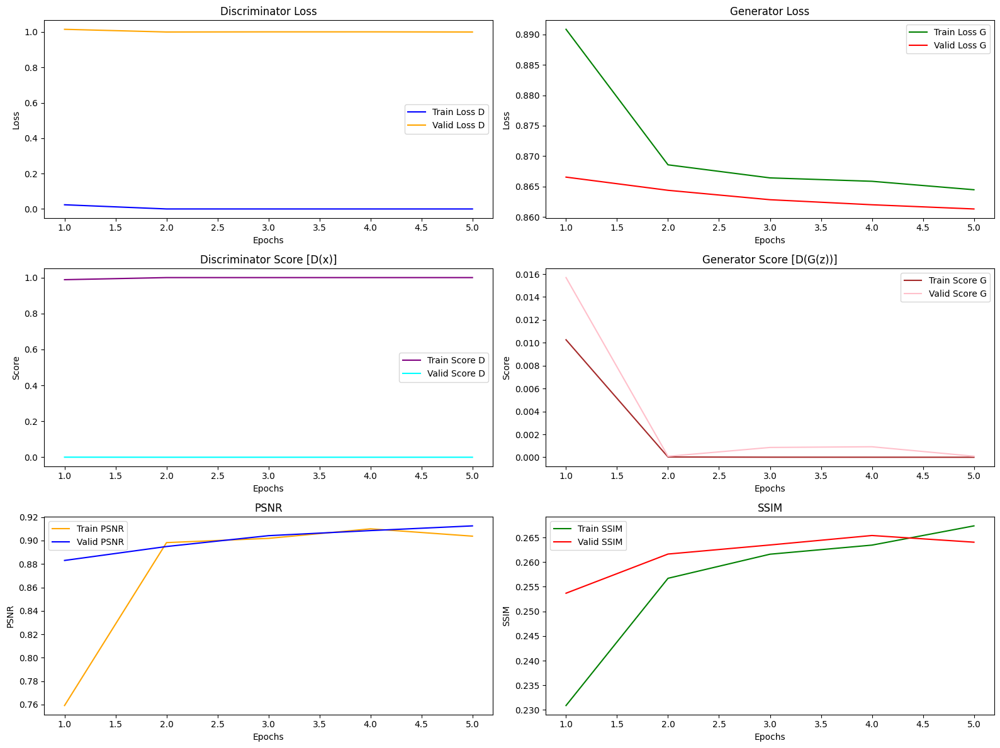

In [18]:
import matplotlib.pyplot as plt
def visualize_results(results):
    epochs = range(1, len(results['d_train_loss']) + 1)

    plt.figure(figsize=(16, 12))
    
    tr_k = len(train_loader.dataset) / len(train_loader)
    vl_k = len(val_loader.dataset) / len(val_loader)

    plt.subplot(3, 2, 1)
    plt.plot(epochs, [tr_k * el for el in results['d_train_loss']], label='Train Loss D', color='blue')
    plt.plot(epochs, [vl_k * el for el in results['d_valid_loss']], label='Valid Loss D', color='orange')
    plt.title('Discriminator Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(3, 2, 2)
    plt.plot(epochs, [tr_k * el for el in results['g_train_loss']], label='Train Loss G', color='green')
    plt.plot(epochs, [vl_k * el for el in results['g_valid_loss']], label='Valid Loss G', color='red')
    plt.title('Generator Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(3, 2, 3)
    plt.plot(epochs, [tr_k * el for el in results['d_train_score']], label='Train Score D', color='purple')
    plt.plot(epochs, [vl_k * el for el in results['d_valid_score']], label='Valid Score D', color='cyan')
    plt.title('Discriminator Score [D(x)]')
    plt.xlabel('Epochs')
    plt.ylabel('Score')
    plt.legend()

    plt.subplot(3, 2, 4)
    plt.plot(epochs, [tr_k * el for el in results['g_train_score']], label='Train Score G', color='brown')
    plt.plot(epochs, [vl_k * el for el in results['g_valid_score']], label='Valid Score G', color='pink')
    plt.title('Generator Score [D(G(z))]')
    plt.xlabel('Epochs')
    plt.ylabel('Score')
    plt.legend()

    plt.subplot(3, 2, 5)
    plt.plot(epochs, [tr_k * el for el in results['train_psnr']], label='Train PSNR', color='orange')
    plt.plot(epochs, [vl_k * el for el in results['valid_psnr']], label='Valid PSNR', color='blue')
    plt.title('PSNR')
    plt.xlabel('Epochs')
    plt.ylabel('PSNR')
    plt.legend()

    plt.subplot(3, 2, 6)
    plt.plot(epochs, [tr_k * el for el in results['train_ssim']], label='Train SSIM', color='green')
    plt.plot(epochs, [vl_k * el for el in results['valid_ssim']], label='Valid SSIM', color='red')
    plt.title('SSIM')
    plt.xlabel('Epochs')
    plt.ylabel('SSIM')
    plt.legend()

    plt.tight_layout()
    plt.show()

visualize_results(results)

[[[0.5970561  0.5389671  0.5058515 ]
  [0.5964854  0.53465945 0.50728816]
  [0.5972208  0.53165674 0.51413906]
  ...
  [0.5847027  0.5694644  0.4358664 ]
  [0.5840949  0.5683954  0.44444922]
  [0.5919583  0.57140565 0.461002  ]]

 [[0.59618425 0.53415316 0.50471133]
  [0.59180677 0.5229196  0.50531596]
  [0.5972195  0.5225157  0.50964403]
  ...
  [0.57145536 0.5651951  0.42403334]
  [0.57985437 0.5601853  0.43072698]
  [0.5786321  0.56616986 0.4449943 ]]

 [[0.59531754 0.527743   0.50235236]
  [0.5929635  0.5183597  0.50146884]
  [0.6033683  0.5125362  0.5144285 ]
  ...
  [0.56749684 0.56926596 0.41579038]
  [0.57710785 0.56497675 0.4229412 ]
  [0.5831063  0.56699926 0.43383285]]

 ...

 [[0.5000634  0.49738535 0.41116542]
  [0.49023828 0.47365266 0.40704256]
  [0.48669648 0.46474797 0.4062792 ]
  ...
  [0.5921316  0.585257   0.42542306]
  [0.579758   0.5804235  0.42969516]
  [0.5864555  0.5765021  0.44252023]]

 [[0.515306   0.50658065 0.4187799 ]
  [0.49749672 0.4833966  0.40933862]


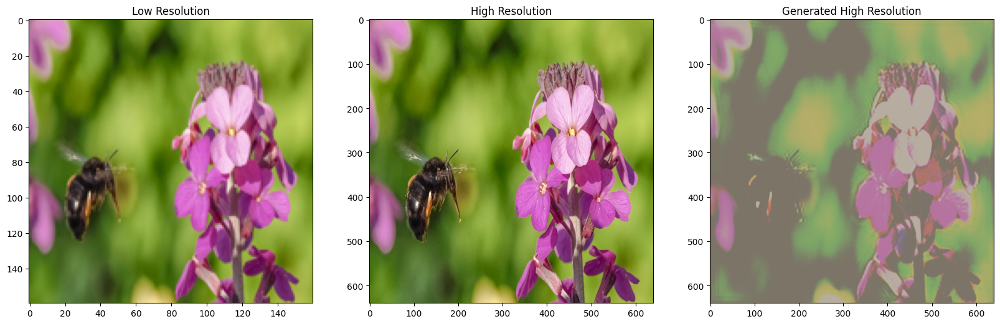

[[[0.62041694 0.6401795  0.60105   ]
  [0.654321   0.65579796 0.6182691 ]
  [0.67166525 0.67242    0.6269555 ]
  ...
  [0.50057584 0.47405955 0.42758575]
  [0.5097579  0.48701355 0.44156295]
  [0.53570646 0.5079239  0.4601272 ]]

 [[0.65492654 0.65325105 0.6150755 ]
  [0.66622734 0.6710958  0.6269939 ]
  [0.69599813 0.67793864 0.6299382 ]
  ...
  [0.4893476  0.46035942 0.41318217]
  [0.49454078 0.4666102  0.4194069 ]
  [0.5094246  0.48519254 0.43384653]]

 [[0.66722554 0.66753125 0.6247225 ]
  [0.6952826  0.6769675  0.62990916]
  [0.7087404  0.67944777 0.6308321 ]
  ...
  [0.48583853 0.4572142  0.40738443]
  [0.48812896 0.4610786  0.4106637 ]
  [0.49820828 0.4721151  0.42205918]]

 ...

 [[0.50389385 0.47957474 0.42452824]
  [0.4914094  0.46425134 0.4131109 ]
  [0.48720157 0.4591584  0.40889564]
  ...
  [0.48505428 0.45614454 0.40606707]
  [0.48545626 0.45685813 0.40657496]
  [0.48797002 0.46090388 0.409289  ]]

 [[0.52044296 0.49403116 0.4397947 ]
  [0.5006429  0.4727351  0.42068577]


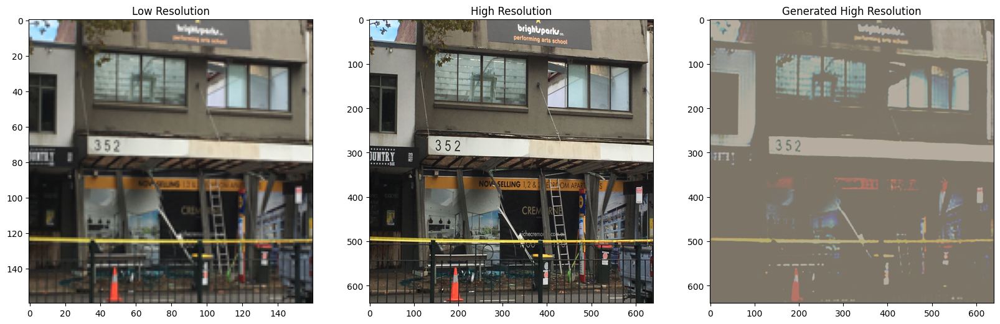

[[[0.55554384 0.5143363  0.4623804 ]
  [0.5435687  0.4991361  0.44973072]
  [0.5271935  0.49061808 0.43403852]
  ...
  [0.49701262 0.4672718  0.4142035 ]
  [0.5053957  0.4782551  0.4257729 ]
  [0.5346044  0.50231785 0.44675076]]

 [[0.53743845 0.49936673 0.44399002]
  [0.51793635 0.48052898 0.4299783 ]
  [0.5062073  0.47114867 0.41824278]
  ...
  [0.4874953  0.45813492 0.4076774 ]
  [0.4920157  0.46222693 0.41168752]
  [0.50721383 0.47888887 0.4244141 ]]

 [[0.5209155  0.48223555 0.42955008]
  [0.501035   0.4703953  0.41706654]
  [0.4947207  0.4626644  0.41050878]
  ...
  [0.48549902 0.45646626 0.40637654]
  [0.48712987 0.45871213 0.4076277 ]
  [0.49530742 0.46729332 0.41540036]]

 ...

 [[0.57408285 0.53971183 0.4782584 ]
  [0.5690289  0.5318574  0.47196296]
  [0.5628584  0.5273478  0.4598539 ]
  ...
  [0.48503333 0.45607233 0.4060262 ]
  [0.4853179  0.45651448 0.4062893 ]
  [0.48727676 0.4594762  0.4079981 ]]

 [[0.5808293  0.5444125  0.4890575 ]
  [0.5740066  0.53696525 0.4774794 ]


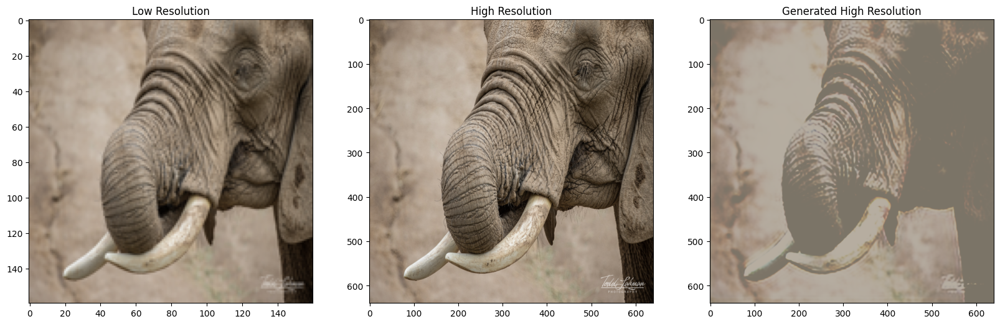

[[[0.60906273 0.54706895 0.48751146]
  [0.6123593  0.54235864 0.48050678]
  [0.611622   0.5345683  0.47341412]
  ...
  [0.6685521  0.6433719  0.5898349 ]
  [0.6544992  0.62416935 0.5713068 ]
  [0.6430074  0.610552   0.5633329 ]]

 [[0.61092514 0.5414102  0.48143286]
  [0.6142516  0.5369182  0.47399074]
  [0.61516595 0.526784   0.46412787]
  ...
  [0.6877151  0.65795094 0.60627675]
  [0.6730038  0.6460657  0.59260905]
  [0.65194166 0.6244974  0.5729787 ]]

 [[0.61131847 0.5372859  0.47309858]
  [0.6112423  0.5307105  0.45978382]
  [0.6208257  0.51815623 0.4520003 ]
  ...
  [0.69866174 0.66894275 0.6142322 ]
  [0.687026   0.6577753  0.6035377 ]
  [0.66692394 0.6379972  0.5822591 ]]

 ...

 [[0.66260767 0.6339749  0.56924164]
  [0.6792191  0.64989454 0.58894867]
  [0.69417137 0.66258955 0.59920925]
  ...
  [0.70725    0.67588544 0.62221044]
  [0.6972584  0.66721827 0.6112744 ]
  [0.67912173 0.6550064  0.5894488 ]]

 [[0.6403038  0.6149732  0.5560482 ]
  [0.66337764 0.6315027  0.57077485]


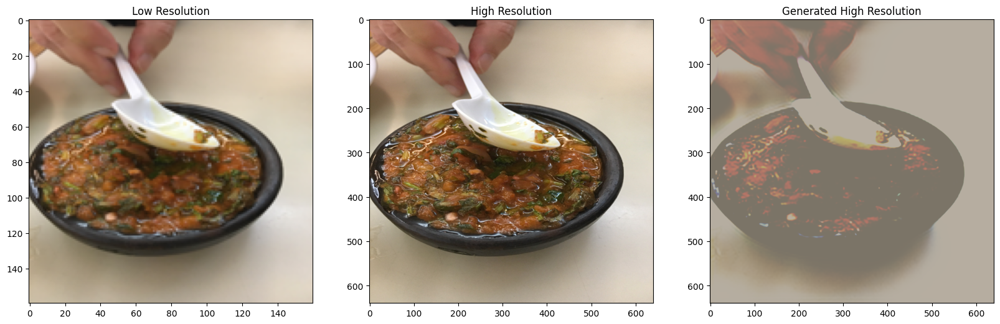

[[[0.53762746 0.4987093  0.4408748 ]
  [0.5207207  0.48171282 0.42700148]
  [0.50602835 0.47301388 0.4156439 ]
  ...
  [0.5399784  0.5087526  0.44093937]
  [0.55853415 0.52696574 0.45994276]
  [0.5802556  0.54508346 0.483217  ]]

 [[0.514429   0.48012137 0.42307317]
  [0.49852777 0.46578315 0.41264638]
  [0.49152553 0.46038175 0.40830946]
  ...
  [0.51661575 0.4872611  0.42429242]
  [0.5439885  0.5051277  0.44380015]
  [0.5608179  0.5316822  0.4656845 ]]

 [[0.50032556 0.46661735 0.41298914]
  [0.4890591  0.46016005 0.40782243]
  [0.4869749  0.45735908 0.40649074]
  ...
  [0.50174737 0.47439572 0.41387746]
  [0.5310495  0.49669376 0.4281482 ]
  [0.5561697  0.52190685 0.45276573]]

 ...

 [[0.51407987 0.48698762 0.42421287]
  [0.49901047 0.4707608  0.41352192]
  [0.49278516 0.46437177 0.4101159 ]
  ...
  [0.5284821  0.5038595  0.42743775]
  [0.53579324 0.51517314 0.4370665 ]
  [0.55149233 0.5283119  0.4499024 ]]

 [[0.5323016  0.5023967  0.4381362 ]
  [0.51167864 0.48153654 0.42227733]


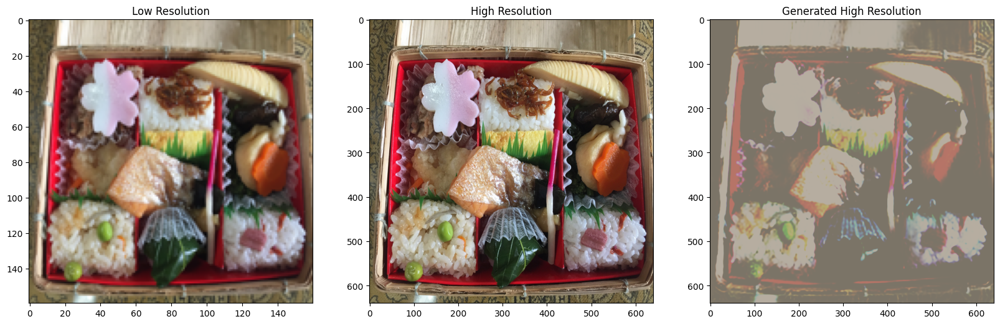

In [19]:
import matplotlib.pyplot as plt

# Function to denormalize images
def denormalize(tensor, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
    mean = torch.tensor(mean).view(1, 3, 1, 1).to(tensor.device)
    std = torch.tensor(std).view(1, 3, 1, 1).to(tensor.device)
    return tensor * std + mean  # Reverse normalization

count = 5
for idx, (low_res, high_res) in enumerate(test_loader):
    if idx == count:
        break

    figure, axs = plt.subplots(1, 3, figsize=(20, 20))

    low_res = low_res[0].unsqueeze(0).to(device)
    high_res = high_res[0].unsqueeze(0).to(device)

    with torch.no_grad():
        generated_high_res = netG(low_res)

    low_res = denormalize(low_res)[0].permute(1, 2, 0).cpu().numpy()
    high_res = denormalize(high_res)[0].permute(1, 2, 0).cpu().numpy()
    generated_high_res = denormalize(generated_high_res)[0].permute(1, 2, 0).cpu().numpy()
    print(generated_high_res)

    # Display images
    axs[0].imshow(low_res.clip(0, 1))  # Clip values to [0, 1] for display
    axs[0].set_title("Low Resolution")
    axs[1].imshow(high_res.clip(0, 1))
    axs[1].set_title("High Resolution")
    axs[2].imshow(generated_high_res.clip(0, 1))
    axs[2].set_title("Generated High Resolution")

    plt.show()


In [39]:
torch.save(netD.state_dict(), "last_D.pt")

## ESRGAN

In [10]:
class ConvolutionalBlock(nn.Module):
    def __init__(self, inp, out, use_act, kernel_size=3, stride=1, padding=1):
        super().__init__()
        self.block = nn.Conv2d(
            inp,
            out,
            kernel_size=kernel_size,
            stride=stride,
            padding=padding
        )
        self.act = nn.LeakyReLU(0.2, inplace=True) if use_act else nn.Identity()
        
    def forward(self, x):
        return self.act(self.block(x))

In [11]:
class Upsample(nn.Module):
    def __init__(self, input, scale_factor=2):
        super().__init__()
        self.upsample = nn.Upsample(scale_factor=scale_factor, mode="nearest")
        self.conv = nn.Conv2d(input, input, 3, 1, 1, bias=True)
        self.act = nn.LeakyReLU(0.2, inplace=True)
        
    def forward(self, x):
        return self.act(self.conv(self.upsample(x)))

In [12]:
class DenseResidual(nn.Module):
    def __init__(self, input, channels=32, residual_beta=0.2):
        super().__init__()
        self.residual_beta = residual_beta
        self.blocks = nn.ModuleList()
        
        for i in range(5):
            self.blocks.append(
                ConvolutionalBlock(
                    input + channels*i,
                    channels if i <= 3 else input,
                    kernel_size=3,
                    stride=1,
                    padding=1,
                    use_act=True if i <=3 else False,
                )
            )
        
    def forward(self, x):
        x_new = x
        for block in self.blocks:
            out = block(x_new)
            x_new = torch.cat([x_new, out], dim=1)
        
        return self.residual_beta * out + x

In [13]:
class BlockRRDB(nn.Module):
    def __init__(self, in_channels, residual_beta=0.2):
        super().__init__()
        self.residual_beta = residual_beta
        self.blockrrdb = nn.Sequential(*[DenseResidual(in_channels) for _ in range(3)])
    
    def forward(self, x):
        return self.blockrrdb(x) * self.residual_beta + x

In [14]:
class Generator(nn.Module):
    def __init__(self, in_channels=3, num_channels=64, num_blocks=23):
        super().__init__()
        self.initial_layer = nn.Conv2d(
            in_channels=in_channels,
            out_channels=num_channels,
            kernel_size=3,
            stride=1,
            padding=1,
            bias=True
        )
        self.residuals_layer = nn.Sequential(*[BlockRRDB(num_channels) for _ in range(num_blocks)])
        self.conv_layer = nn.Conv2d(num_channels, num_channels, kernel_size=3, stride=1, padding=1)
        self.upsamples_layer = nn.Sequential(
            Upsample(num_channels),
            Upsample(num_channels)
        )
        self.final_layer = nn.Sequential(
            nn.Conv2d(num_channels, num_channels, kernel_size=3, stride=1, padding=1, bias=True),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(num_channels, in_channels, kernel_size=1, stride=1, padding=0, bias=True)
        )
        
    def forward(self, x):
        initial_layer = self.initial_layer(x)
        out = self.residuals_layer(initial_layer)
        out = self.conv_layer(out) + initial_layer
        out = self.upsamples_layer(out)
        out = self.final_layer(out)
        return out

In [15]:
class Discriminator(nn.Module):
    def __init__(self, in_channels=3, features=(64, 64, 128, 128, 256, 256, 512, 512)):
        super().__init__()

        self.in_channels = in_channels
        self.features = list(features)

        blocks = []

        for idx, feature in enumerate(self.features):
            blocks.append(
                ConvolutionalBlock(
                    inp=in_channels,
                    out=feature,
                    kernel_size=3,
                    stride=1 + idx % 2,
                    padding=1,
                    use_act=True
                )
            )
            in_channels=feature

        self.blocks = nn.Sequential(*blocks)

        self.classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d((6, 6)),
            nn.Flatten(),
            nn.Linear(in_features=512*6*6, out_features=1024),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(in_features=1024, out_features=1)
        )
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        features = self.blocks(x)
        out = self.classifier(features)
        return out

In [16]:
def init_weights(model, scale=0.1):
    for m in model.modules():
        if isinstance(m, nn.Conv2d):
            nn.init.kaiming_normal_(m.weight.data)
            m.weight.data *= scale
        elif isinstance(m, nn.Linear):
            nn.init.kaiming_normal_(m.weight.data)
            m.weight.data *= scale

In [17]:
from torchvision.models import vgg19
class Loss(nn.Module):
    def __init__(self, device):
        super().__init__()

        self.vgg = vgg19(pretrained=True).features[:35].eval().to(device)
        self.loss = nn.MSELoss()

        for param in self.vgg.parameters():
            param.requires_grad = False

    def forward(self, output, target):
        vgg_inputs = self.vgg(output)
        vgg_targets = self.vgg(target)
        loss = self.loss(vgg_inputs, vgg_targets)

        return loss

In [18]:
class GANLoss(nn.Module):
    def __init__(self, l1_weight=1e-2, vgg_weight=1, device='cpu'):
        super().__init__()
        
        self.vgg_loss = Loss(device)
        self.l1_loss = nn.L1Loss().to(device)
        self.l1_weights = l1_weight
        
    def forward(self, output, target):
        vgg_loss = self.vgg_loss(output, target)
        l1_loss = self.l1_loss(output, target)
        
        loss = vgg_loss + self.l1_weights * l1_loss
        return loss

In [19]:
def penalty_gradient(critic, actual, fake, device):
    batch_size, channels, height, width = actual.shape
    alpha = torch.rand((batch_size, 1, 1, 1)).repeat(1, channels, height, width).to(device)
    interpolated = actual * alpha + fake.detach() * (1 - alpha)
    interpolated.requires_grad_(True)

    mixed_scores = critic(interpolated)

    gradients = torch.autograd.grad(
        inputs=interpolated,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
        retain_graph=True,
    )[0]
    gradients = gradients.view(gradients.shape[0], -1)
    gradient_norm = gradients.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)

    return gradient_penalty

In [20]:
device = "cuda" if torch.cuda.is_available() else "cpu"

In [21]:
lr = 1e-4
num_epochs = 5
batch_size = 8
lambda_gp = 10
num_workers = 4

In [22]:
torch.backends.cuda.matmul.allow_tf32 = False
torch.backends.cudnn.benchmark = True

In [23]:
num_channels = 3
generator = Generator(in_channels=num_channels, num_blocks=1).to(device)
discriminator = Discriminator(num_channels).to(device)
init_weights(generator)
model = {
    'discriminator': discriminator,
    'generator': generator
}

In [24]:
optimizer_generator = torch.optim.AdamW(model['generator'].parameters(), lr=lr, betas=(0.0, 0.9))
optimizer_discriminator = torch.optim.AdamW(model['discriminator'].parameters(), lr=lr, betas=(0.0, 0.9))
optimizer = {
    'discriminator': optimizer_discriminator,
    'generator': optimizer_generator
}

In [25]:
criterion_generator = GANLoss(l1_weight=1e-2,device=device)
criterion_discriminator = nn.BCELoss().to(device)
criterion = {
    'discriminator': criterion_discriminator,
    'generator': criterion_generator
}

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:02<00:00, 230MB/s] 


In [26]:
generator_scaler = torch.amp.GradScaler('cuda')
discriminator_scaler = torch.amp.GradScaler('cuda')

In [27]:
def train(train_loader, val_loader,disc,gen,opt_gen, opt_disc, l1, vgg_loss, g_scaler, d_scaler, tb_step, num_epochs=10, device = 'cpu'):
    for iteration in range(num_epochs):
        loop = tqdm(train_loader, leave=True)

        for idx, (low_res, high_res) in enumerate(loop):
            high_res = high_res.to(device)
            low_res = low_res.to(device)

            with torch.amp.autocast('cuda'):
                fake = gen(low_res)
                disc_real = disc(high_res)
                disc_fake = disc(fake.detach())
                gp = penalty_gradient(disc, high_res, fake, device=device)
                loss_disc = (
                    -(torch.mean(disc_real) - torch.mean(disc_fake))
                    + lambda_gp * gp
                )

            opt_disc.zero_grad()
            d_scaler.scale(loss_disc).backward()
            d_scaler.step(opt_disc)
            d_scaler.update()

            # Train Generator: min log(1 - D(G(z))) <-> max log(D(G(z))
            with torch.amp.autocast('cuda'):
                l1_loss = 1e-2 * l1(fake, high_res)
                adv_loss = 5e-3 * -torch.mean(disc(fake))
                loss_vgg = vgg_loss(fake, high_res)
                gen_loss = l1_loss + loss_vgg + adv_loss

            opt_gen.zero_grad()
            g_scaler.scale(gen_loss).backward()
            g_scaler.step(opt_gen)
            g_scaler.update()
            tb_step += 1

            loop.set_postfix(
                epoch=str(iteration)+"/"+str(num_epochs),
                gp=gp.item(),
                critic=loss_disc.item(),
                l1=l1_loss.item(),
                vgg=loss_vgg.item(),
                adversarial=adv_loss.item(),
            )

        with torch.no_grad():
            loop1 = tqdm(val_loader, leave=True)
            for idx, (low_res, high_res) in enumerate(loop1):
                high_res = high_res.to(device)
                low_res = low_res.to(device)

                with torch.amp.autocast('cuda'):
                    fake = gen(low_res)
                    disc_real = disc(high_res)
                    disc_fake = disc(fake.detach())

                with torch.amp.autocast('cuda'):
                    l1_loss = 1e-2 * l1(fake, high_res)
                    adv_loss = 5e-3 * -torch.mean(disc(fake))
                    loss_vgg = vgg_loss(fake, high_res)
                    gen_loss = l1_loss + loss_vgg + adv_loss

                loop1.set_postfix(
                    epoch=str(iteration)+"/"+str(num_epochs),
                    l1=l1_loss.item(),
                    vgg=loss_vgg.item(),
                    adversarial=adv_loss.item(),
                )


In [28]:
trainer = train(
    train_loader = train_loader,
    val_loader = val_loader,
    disc = model["discriminator"],
    gen = model['generator'],
    opt_gen = optimizer['generator'],
    opt_disc = optimizer['discriminator'],
    l1 = nn.L1Loss(),
    vgg_loss = Loss(device),
    g_scaler = generator_scaler,
    d_scaler = discriminator_scaler,
    tb_step = 0,
    device = device,
    num_epochs = 5
)

  0%|          | 0/464 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/torch/autograd/graph.py:825: UserWarning: Attempting to run cuBLAS, but there was no current CUDA context! Attempting to set the primary context... (Triggered internally at ../aten/src/ATen/cuda/CublasHandlePool.cpp:135.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/464 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/464 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

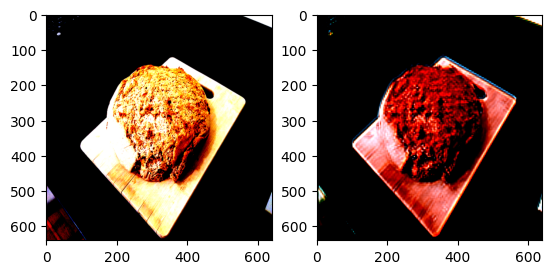

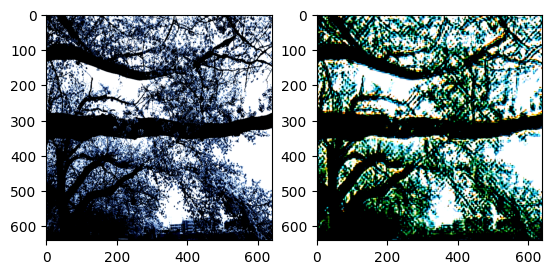

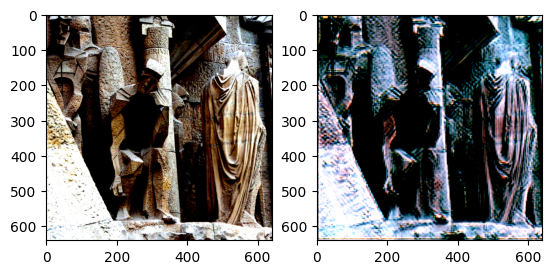

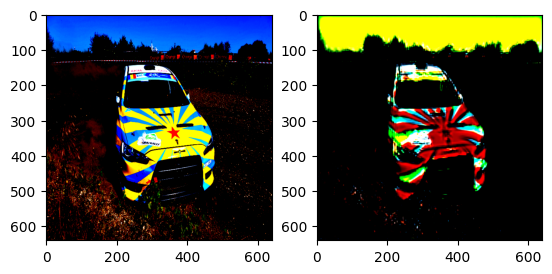

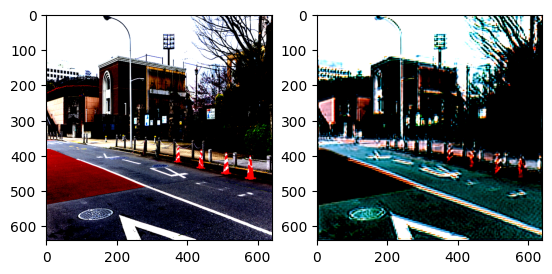

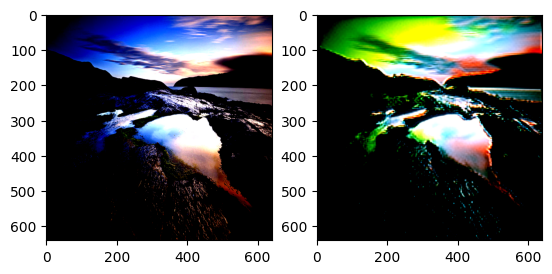

In [30]:
import matplotlib.pyplot as plt

topil = transforms.ToPILImage()
count = 5

for iteration, (low_res, high_res) in enumerate(tqdm(test_loader), 0):
    fig, axes = plt.subplots(1, 2)

    axes[0].imshow(high_res[0].permute(1, 2, 0))
    low_res = low_res.to(device)
    fake_high_res = model['generator'](low_res)
    fake_high_res = fake_high_res.to('cpu').detach()
    axes[1].imshow(fake_high_res[0].permute(1, 2, 0))
    if count == 0:
        break
    count -= 1

## Training for 5 more epochs

In [31]:
trainer = train(
    train_loader = train_loader,
    val_loader = val_loader,
    disc = model["discriminator"],
    gen = model['generator'],
    opt_gen = optimizer['generator'],
    opt_disc = optimizer['discriminator'],
    l1 = nn.L1Loss(),
    vgg_loss = Loss(device),
    g_scaler = generator_scaler,
    d_scaler = discriminator_scaler,
    tb_step = 0,
    device = device,
    num_epochs = 5
)

  0%|          | 0/464 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/464 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/464 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/464 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/464 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

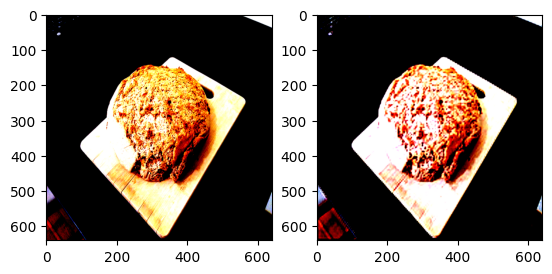

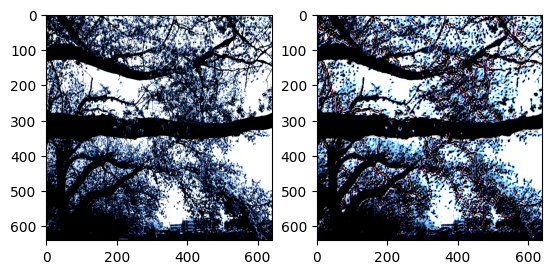

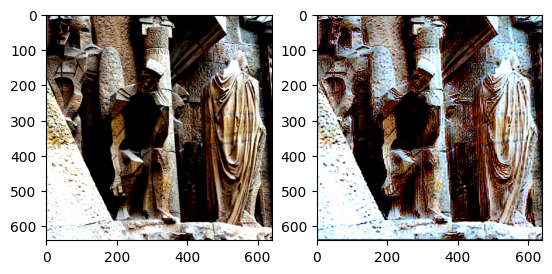

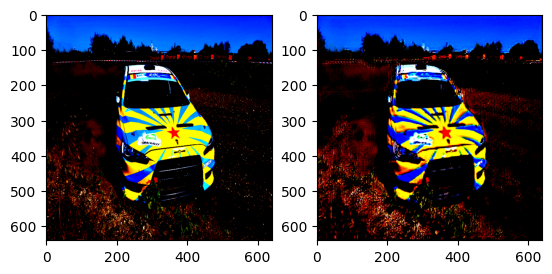

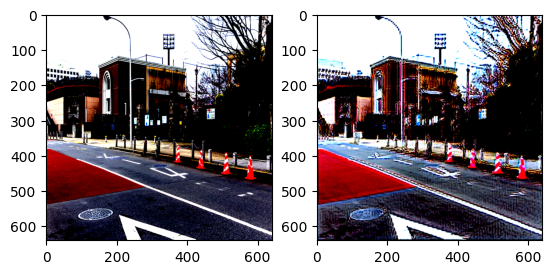

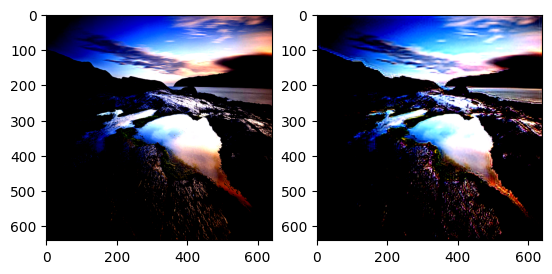

In [33]:
import matplotlib.pyplot as plt

topil = transforms.ToPILImage()
count = 5

for iteration, (low_res, high_res) in enumerate(tqdm(test_loader), 0):
    fig, axes = plt.subplots(1, 2)

    axes[0].imshow(high_res[0].permute(1, 2, 0))
    low_res = low_res.to(device)
    fake_high_res = model['generator'](low_res)
    fake_high_res = fake_high_res.to('cpu').detach()
    axes[1].imshow(fake_high_res[0].permute(1, 2, 0))
    if count == 0:
        break
    count -= 1

In [36]:
torch.save(generator.state_dict(), "generator.pt")
torch.save(discriminator.state_dict(), "discriminator.pt")

In [29]:
generator.load_state_dict(torch.load("/kaggle/input/srgan-esrgan/generator.pt"))
discriminator.load_state_dict(torch.load("/kaggle/input/srgan-esrgan/discriminator.pt"))

/tmp/ipykernel_31/2009726837.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  generator.load_state_dict(torch.load("/kaggle/input/srgan-esrgan/generator.pt"))
/tmp/ipyker

<All keys matched successfully>

In [30]:
trainer = train(
    train_loader = train_loader,
    val_loader = val_loader,
    disc = model["discriminator"],
    gen = model['generator'],
    opt_gen = optimizer['generator'],
    opt_disc = optimizer['discriminator'],
    l1 = nn.L1Loss(),
    vgg_loss = Loss(device),
    g_scaler = generator_scaler,
    d_scaler = discriminator_scaler,
    tb_step = 0,
    device = device,
    num_epochs = 10
)

  0%|          | 0/464 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/torch/autograd/graph.py:825: UserWarning: Attempting to run cuBLAS, but there was no current CUDA context! Attempting to set the primary context... (Triggered internally at ../aten/src/ATen/cuda/CublasHandlePool.cpp:135.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/464 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/464 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/464 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/464 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/464 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/464 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/464 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/464 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/464 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

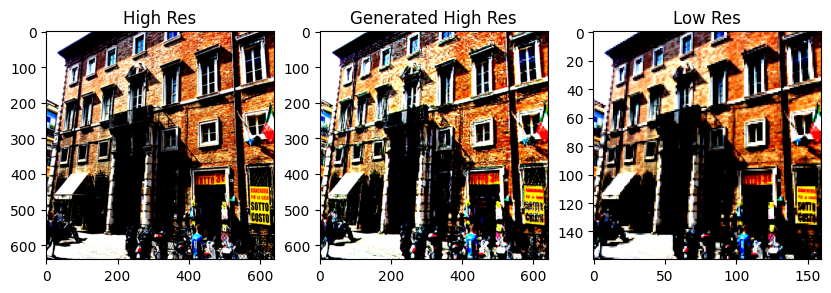

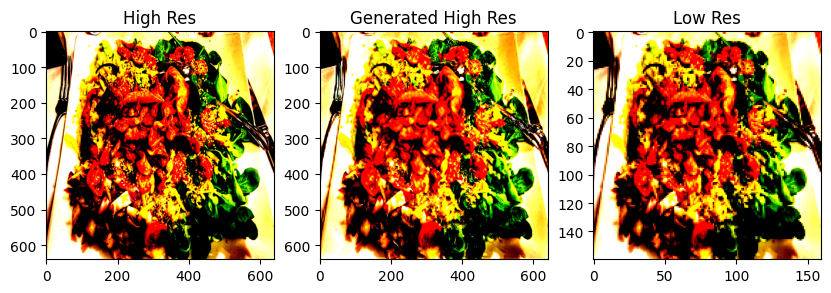

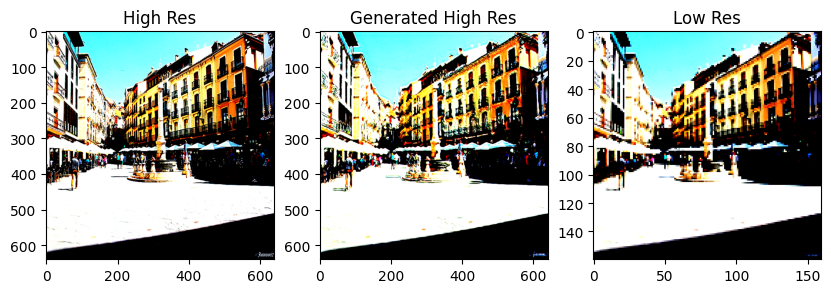

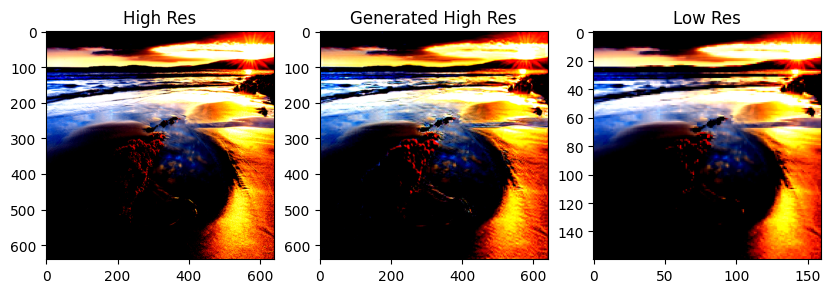

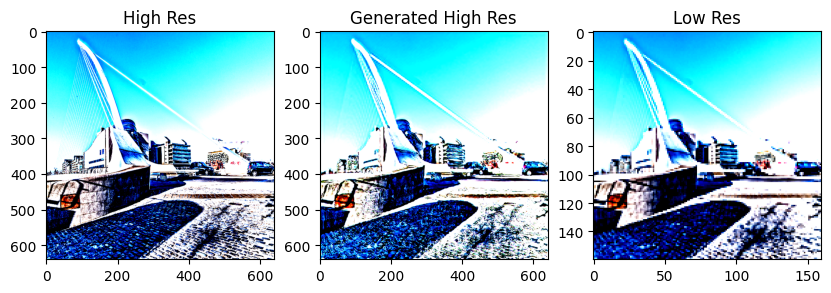

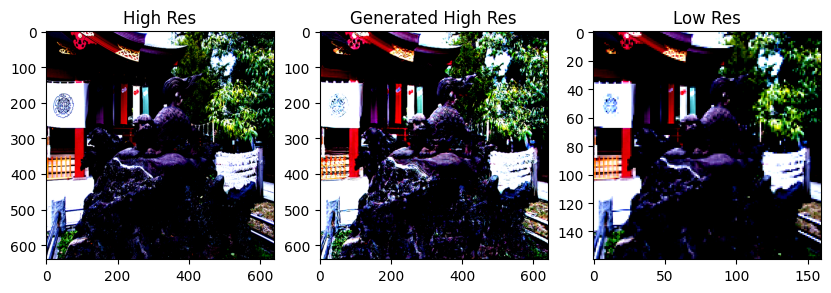

In [35]:
import matplotlib.pyplot as plt

topil = transforms.ToPILImage()
count = 5

for iteration, (low_res, high_res) in enumerate(tqdm(test_loader), 0):
    fig, axes = plt.subplots(1, 3, figsize=(10, 10))
    
    axes[0].imshow(high_res[0].permute(1, 2, 0))
    axes[0].set_title("High Res")
    axes[2].imshow(low_res[0].permute(1, 2, 0))
    axes[2].set_title("Low Res")
    low_res = low_res.to(device)
    fake_high_res = model['generator'](low_res)
    fake_high_res = fake_high_res.to('cpu').detach()
    axes[1].imshow(fake_high_res[0].permute(1, 2, 0))
    axes[1].set_title("Generated High Res")
    if count == 0:
        break
    count -= 1